# Previsão de fraude

## Importação dos dados

In [1]:
import kagglehub
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pandas as pd
import numpy as np
from tqdm.notebook import trange, tqdm
from glob import glob
from sklearn.model_selection import train_test_split


In [2]:
path = kagglehub.dataset_download("priyamchoksi/credit-card-transactions-dataset")
print("Path to dataset files:", path)

data_path = os.path.join(path, "credit_card_transactions.csv")
df = pd.read_csv(data_path)
df.head()

100%|██████████| 145M/145M [00:01<00:00, 106MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/priyamchoksi/credit-card-transactions-dataset/versions/1


,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,28705.0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,NaN
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,83236.0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,NaN
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,22844.0


In [3]:
df.dtypes

,0
Unnamed: 0,int64
trans_date_trans_time,object
cc_num,int64
merchant,object
category,object
amt,float64
first,object
last,object
gender,object
street,object


In [ ]:
df.isnull().sum()

,0
Unnamed: 0,0
trans_date_trans_time,0
cc_num,0
merchant,0
category,0
amt,0
first,0
last,0
gender,0
street,0


In [4]:
len(df["cc_num"].unique())

983

## Explorando variáveis numéricas

In [5]:
df2 = df[['cc_num', 'amt', 'lat', 'long', 'unix_time', 'merch_lat', 'merch_long', 'zip', 'merch_zipcode', 'is_fraud']]
df2.head()

,cc_num,amt,lat,long,unix_time,merch_lat,merch_long,zip,merch_zipcode,is_fraud
0,2703186189652095,4.97,36.0788,-81.1781,1325376018,36.011293,-82.048315,28654,28705.0,0
1,630423337322,107.23,48.8878,-118.2105,1325376044,49.159047,-118.186462,99160,NaN,0
2,38859492057661,220.11,42.1808,-112.2620,1325376051,43.150704,-112.154481,83252,83236.0,0
3,3534093764340240,45.00,46.2306,-112.1138,1325376076,47.034331,-112.561071,59632,NaN,0
4,375534208663984,41.96,38.4207,-79.4629,1325376186,38.674999,-78.632459,24433,22844.0,0


### Correlação

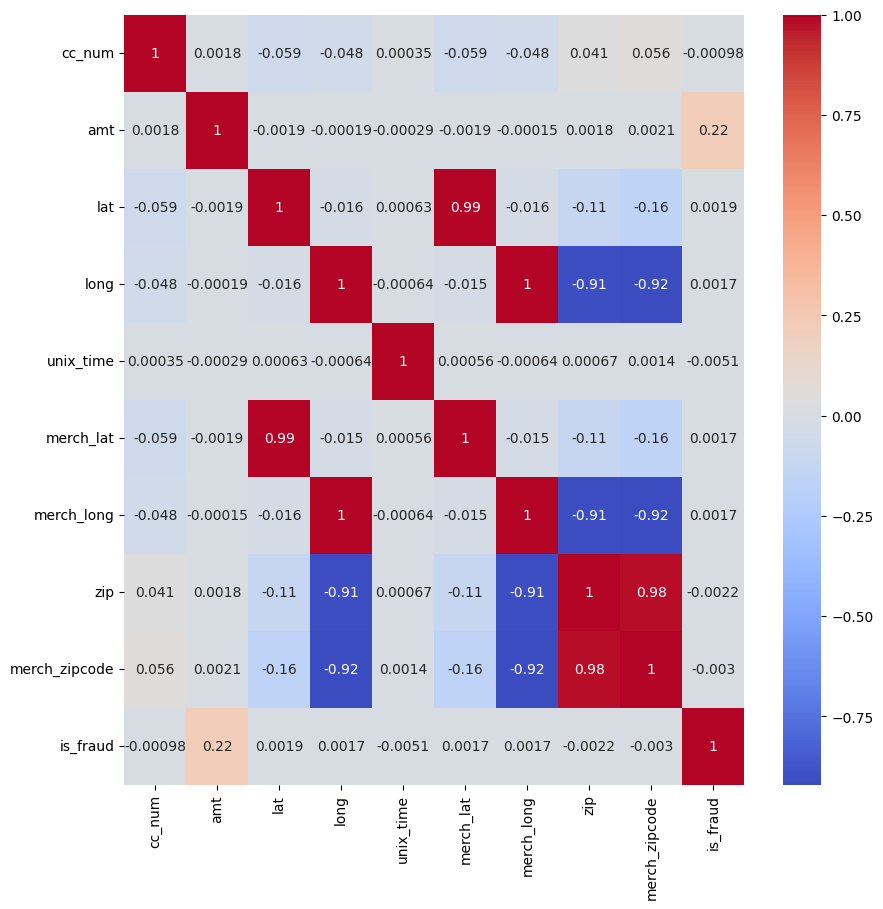

In [6]:
fig, ax = plt.subplots(figsize=(10,10))

corr = df2.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', ax=ax)
plt.show()

<ipython-input-14-37330ffa2d6c>:9: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  stats = grouped.apply(calculate_stats)


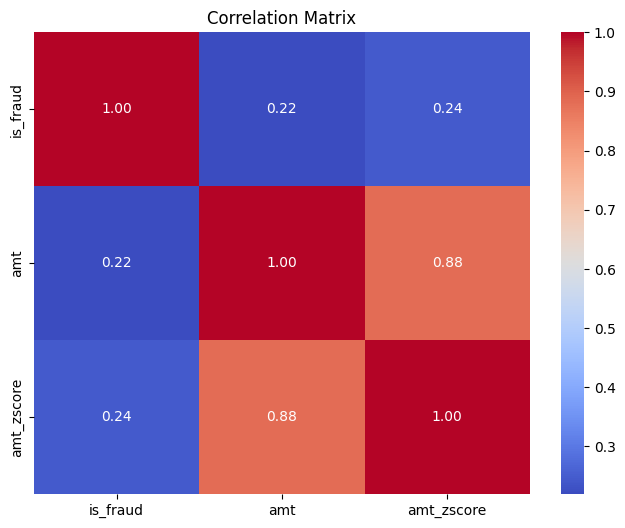

In [14]:
grouped = df2.groupby('cc_num')

def calculate_stats(x):
    return pd.Series({
        'amt_mean': x['amt'].mean(),
        'amt_std': x['amt'].std()
    })

stats = grouped.apply(calculate_stats)
stats = stats.reset_index()
df3 = pd.merge(df2, stats, on='cc_num')
df3['amt_zscore'] = (df3['amt'] - df3['amt_mean']) / df3['amt_std']
df3 = df3.drop(['amt_mean', 'amt_std'], axis=1)

correlation_matrix = df3[['is_fraud', 'amt', 'amt_zscore']].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

### Proporção de fraude

In [7]:
df2['is_fraud'].value_counts(), df2['is_fraud'].value_counts(normalize=True)

(is_fraud
 0    1289169
 1       7506
 Name: count, dtype: int64,
 is_fraud
 0    0.994211
 1    0.005789
 Name: proportion, dtype: float64)

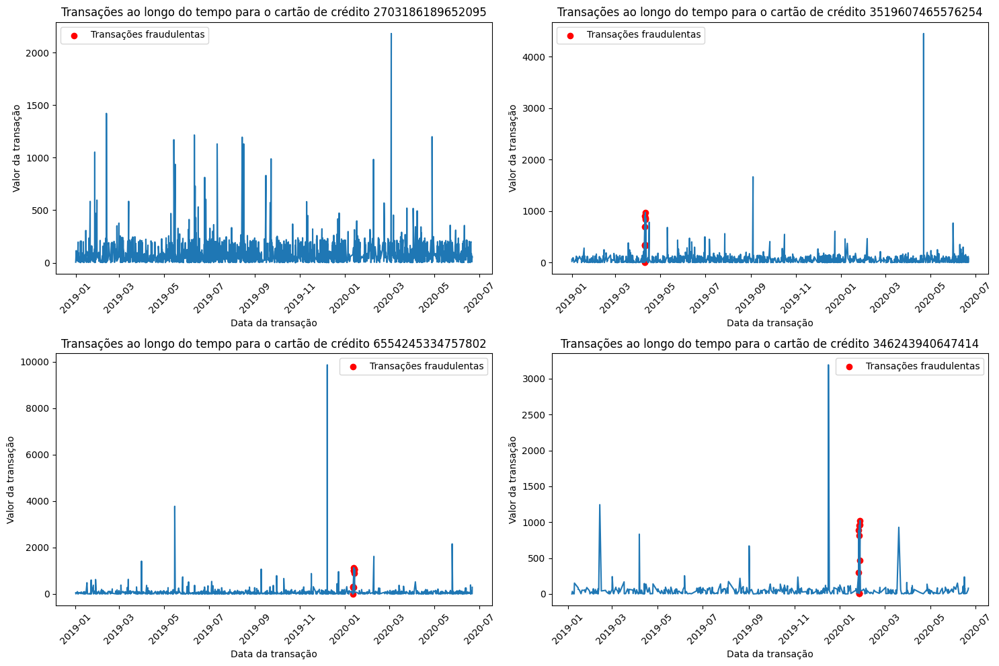

In [15]:
list_of_dataframes = []

for cc_num in df["cc_num"].unique():
  temp_df = df[df["cc_num"] == cc_num]
  list_of_dataframes.append(temp_df)


fig, axs = plt.subplots(2, 2, figsize=(15, 10))
axs = axs.flatten()

rand_indexes = [0, 120, 300, 900]

for i, j in enumerate(rand_indexes):
    data = list_of_dataframes[j].copy()

    data['trans_date_trans_time'] = pd.to_datetime(data['trans_date_trans_time'])
    data = data.sort_values(by="trans_date_trans_time")
    fraudulent_transactions = data[data['is_fraud'] == 1]

    axs[i].plot(data['trans_date_trans_time'], data['amt'])
    axs[i].scatter(fraudulent_transactions['trans_date_trans_time'], fraudulent_transactions['amt'], color='red', label='Transações fraudulentas')

    axs[i].set_xlabel("Data da transação")
    axs[i].set_ylabel("Valor da transação")
    axs[i].set_title(f"Transações ao longo do tempo para o cartão de crédito {data['cc_num'].iloc[0]}")
    axs[i].legend()
    axs[i].tick_params(axis='x', labelrotation=45)

plt.tight_layout()
plt.show()

## Classificação

### Regressão Logística

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    257815
           1       0.07      0.71      0.13      1520

    accuracy                           0.94    259335
   macro avg       0.53      0.83      0.55    259335
weighted avg       0.99      0.94      0.97    259335



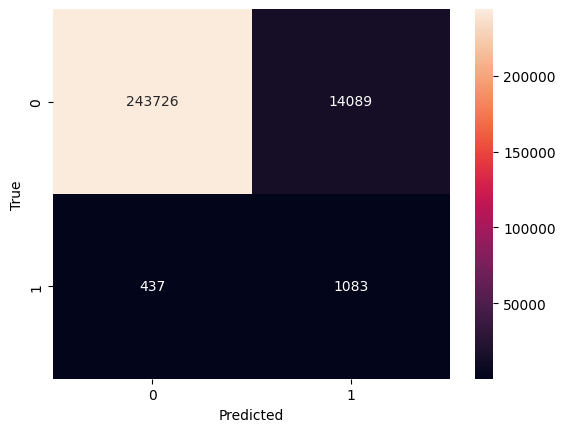

In [16]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report

X = df3[['amt_zscore']]
y = df3['is_fraud']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LogisticRegression(class_weight='balanced')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

              precision    recall  f1-score   support

           0       1.00      0.95      0.97    257815
           1       0.09      0.78      0.16      1520

    accuracy                           0.95    259335
   macro avg       0.54      0.86      0.57    259335
weighted avg       0.99      0.95      0.97    259335



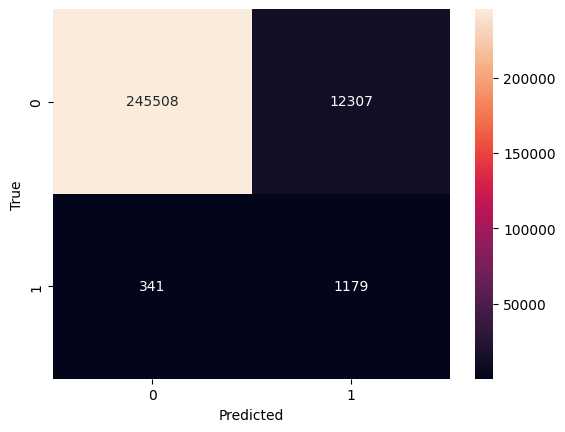

In [17]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

independent_variables = [col for col in df3.columns if col not in ['is_fraud', 'cc_num', 'merch_zipcode']]
X = df3[independent_variables]
y = df3['is_fraud']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

model = LogisticRegression(class_weight='balanced')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

### Random Forest

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    257815
           1       0.85      0.40      0.55      1520

    accuracy                           1.00    259335
   macro avg       0.92      0.70      0.77    259335
weighted avg       1.00      1.00      1.00    259335



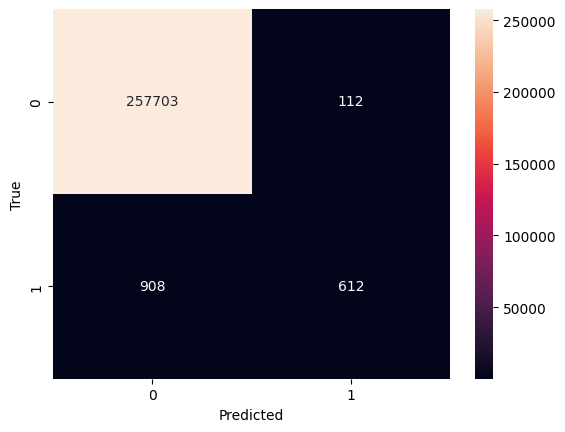

In [18]:
from sklearn.ensemble import RandomForestClassifier

independent_variables = [col for col in df3.columns if col not in ['is_fraud', 'cc_num', 'merch_zipcode']]
X = df3[independent_variables]
y = df3['is_fraud']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(class_weight='balanced', random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## Séries temporais

#### Fazendo janelamento

In [ ]:
independent_variables = [col for col in df3.columns if col not in ['is_fraud', 'cc_num', 'merch_zipcode']]
independent_variables

In [ ]:
def janelize(data, window_size = 12, forecast_size = 1):
    data = data.sort_values('unix_time')
    grouped = data.groupby('cc_num')

    datas = {}

    for cc_num, group in tqdm(grouped, desc="Processing groups"):
      di = {}

      for i in trange(window_size, len(group) - forecast_size):
        arr = {}

        for j in range(window_size):
          arr[f'amt_{j}'] = (data['amt'].iloc[i - j])
          arr[f'merch_lat_{j}'] = (data['merch_lat'].iloc[i - j])
          arr[f'merch_long_{j}'] = (data['merch_long'].iloc[i - j])
          arr[f'unix_time_{j}'] = (data['unix_time'].iloc[i - j])
          arr[f'is_fraud_{j}'] = (data['is_fraud'].iloc[i - j])

        arr['amt'] = (data['amt'].iloc[i + 1])
        arr['merch_lat'] = (data['merch_lat'].iloc[i + 1])
        arr['merch_long'] = (data['merch_long'].iloc[i + 1])
        arr['unix_time'] = (data['unix_time'].iloc[i + 1])
        arr['is_fraud'] = (data['is_fraud'].iloc[i + 1])


        di[str(i)] = arr
      pd.DataFrame(di).T.to_csv(f'/content/drive/MyDrive/datasets/credit/{cc_num}.csv')
    return datas


# janelized_df = janelize(df3)
# janelized_df.keys()

Processing groups:   0%|          | 0/983 [00:00<?, ?it/s]

  0%|          | 0/1505 [00:00<?, ?it/s]

  0%|          | 0/1518 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/515 [00:00<?, ?it/s]

  0%|          | 0/483 [00:00<?, ?it/s]

  0%|          | 0/997 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/1546 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/502 [00:00<?, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1507 [00:00<?, ?it/s]

  0%|          | 0/1988 [00:00<?, ?it/s]

  0%|          | 0/1561 [00:00<?, ?it/s]

  0%|          | 0/1019 [00:00<?, ?it/s]

  0%|          | 0/1536 [00:00<?, ?it/s]

  0%|          | 0/2552 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/499 [00:00<?, ?it/s]

  0%|          | 0/1550 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/2545 [00:00<?, ?it/s]

  0%|          | 0/1057 [00:00<?, ?it/s]

  0%|          | 0/496 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/3110 [00:00<?, ?it/s]

  0%|          | 0/1996 [00:00<?, ?it/s]

  0%|          | 0/1529 [00:00<?, ?it/s]

  0%|          | 0/520 [00:00<?, ?it/s]

  0%|          | 0/2079 [00:00<?, ?it/s]

  0%|          | 0/1481 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1021 [00:00<?, ?it/s]

  0%|          | 0/1546 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/2539 [00:00<?, ?it/s]

  0%|          | 0/1492 [00:00<?, ?it/s]

  0%|          | 0/2023 [00:00<?, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/3017 [00:00<?, ?it/s]

  0%|          | 0/3086 [00:00<?, ?it/s]

  0%|          | 0/1549 [00:00<?, ?it/s]

  0%|          | 0/2010 [00:00<?, ?it/s]

  0%|          | 0/3061 [00:00<?, ?it/s]

  0%|          | 0/2034 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/1990 [00:00<?, ?it/s]

  0%|          | 0/2549 [00:00<?, ?it/s]

  0%|          | 0/1020 [00:00<?, ?it/s]

  0%|          | 0/990 [00:00<?, ?it/s]

  0%|          | 0/492 [00:00<?, ?it/s]

  0%|          | 0/525 [00:00<?, ?it/s]

  0%|          | 0/1004 [00:00<?, ?it/s]

  0%|          | 0/1557 [00:00<?, ?it/s]

  0%|          | 0/527 [00:00<?, ?it/s]

  0%|          | 0/2029 [00:00<?, ?it/s]

  0%|          | 0/2078 [00:00<?, ?it/s]

  0%|          | 0/1016 [00:00<?, ?it/s]

  0%|          | 0/1021 [00:00<?, ?it/s]

  0%|          | 0/1525 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2038 [00:00<?, ?it/s]

  0%|          | 0/495 [00:00<?, ?it/s]

  0%|          | 0/1022 [00:00<?, ?it/s]

  0%|          | 0/1014 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/1511 [00:00<?, ?it/s]

  0%|          | 0/510 [00:00<?, ?it/s]

  0%|          | 0/1515 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/1035 [00:00<?, ?it/s]

  0%|          | 0/509 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2036 [00:00<?, ?it/s]

  0%|          | 0/2561 [00:00<?, ?it/s]

  0%|          | 0/996 [00:00<?, ?it/s]

  0%|          | 0/509 [00:00<?, ?it/s]

  0%|          | 0/1506 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2025 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

  0%|          | 0/2003 [00:00<?, ?it/s]

  0%|          | 0/513 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/1568 [00:00<?, ?it/s]

  0%|          | 0/489 [00:00<?, ?it/s]

  0%|          | 0/1010 [00:00<?, ?it/s]

  0%|          | 0/2015 [00:00<?, ?it/s]

  0%|          | 0/1544 [00:00<?, ?it/s]

  0%|          | 0/1036 [00:00<?, ?it/s]

  0%|          | 0/1536 [00:00<?, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

  0%|          | 0/1453 [00:00<?, ?it/s]

  0%|          | 0/993 [00:00<?, ?it/s]

  0%|          | 0/2062 [00:00<?, ?it/s]

  0%|          | 0/1017 [00:00<?, ?it/s]

  0%|          | 0/1028 [00:00<?, ?it/s]

  0%|          | 0/1023 [00:00<?, ?it/s]

  0%|          | 0/511 [00:00<?, ?it/s]

  0%|          | 0/1525 [00:00<?, ?it/s]

  0%|          | 0/510 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2559 [00:00<?, ?it/s]

  0%|          | 0/1037 [00:00<?, ?it/s]

  0%|          | 0/2096 [00:00<?, ?it/s]

  0%|          | 0/1011 [00:00<?, ?it/s]

  0%|          | 0/2002 [00:00<?, ?it/s]

  0%|          | 0/995 [00:00<?, ?it/s]

  0%|          | 0/1556 [00:00<?, ?it/s]

  0%|          | 0/2541 [00:00<?, ?it/s]

  0%|          | 0/1006 [00:00<?, ?it/s]

  0%|          | 0/1056 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/2024 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/522 [00:00<?, ?it/s]

  0%|          | 0/992 [00:00<?, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/2056 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2025 [00:00<?, ?it/s]

  0%|          | 0/2008 [00:00<?, ?it/s]

  0%|          | 0/991 [00:00<?, ?it/s]

  0%|          | 0/2563 [00:00<?, ?it/s]

  0%|          | 0/2038 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/2909 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2578 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

  0%|          | 0/1547 [00:00<?, ?it/s]

  0%|          | 0/989 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/1989 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2075 [00:00<?, ?it/s]

  0%|          | 0/2555 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/1032 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1512 [00:00<?, ?it/s]

  0%|          | 0/2039 [00:00<?, ?it/s]

  0%|          | 0/2056 [00:00<?, ?it/s]

  0%|          | 0/488 [00:00<?, ?it/s]

  0%|          | 0/2022 [00:00<?, ?it/s]

  0%|          | 0/2067 [00:00<?, ?it/s]

  0%|          | 0/2011 [00:00<?, ?it/s]

  0%|          | 0/1030 [00:00<?, ?it/s]

  0%|          | 0/485 [00:00<?, ?it/s]

  0%|          | 0/2511 [00:00<?, ?it/s]

  0%|          | 0/2044 [00:00<?, ?it/s]

  0%|          | 0/1537 [00:00<?, ?it/s]

  0%|          | 0/1039 [00:00<?, ?it/s]

  0%|          | 0/1022 [00:00<?, ?it/s]

  0%|          | 0/2041 [00:00<?, ?it/s]

  0%|          | 0/2574 [00:00<?, ?it/s]

  0%|          | 0/1546 [00:00<?, ?it/s]

  0%|          | 0/1501 [00:00<?, ?it/s]

  0%|          | 0/1034 [00:00<?, ?it/s]

  0%|          | 0/1516 [00:00<?, ?it/s]

  0%|          | 0/1547 [00:00<?, ?it/s]

  0%|          | 0/2046 [00:00<?, ?it/s]

  0%|          | 0/510 [00:00<?, ?it/s]

  0%|          | 0/2058 [00:00<?, ?it/s]

  0%|          | 0/2551 [00:00<?, ?it/s]

  0%|          | 0/1541 [00:00<?, ?it/s]

  0%|          | 0/2557 [00:00<?, ?it/s]

  0%|          | 0/1511 [00:00<?, ?it/s]

  0%|          | 0/2538 [00:00<?, ?it/s]

  0%|          | 0/3058 [00:00<?, ?it/s]

  0%|          | 0/1015 [00:00<?, ?it/s]

  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1494 [00:00<?, ?it/s]

  0%|          | 0/2993 [00:00<?, ?it/s]

  0%|          | 0/2936 [00:00<?, ?it/s]

  0%|          | 0/1509 [00:00<?, ?it/s]

  0%|          | 0/1530 [00:00<?, ?it/s]

  0%|          | 0/1510 [00:00<?, ?it/s]

  0%|          | 0/1010 [00:00<?, ?it/s]

  0%|          | 0/511 [00:00<?, ?it/s]

  0%|          | 0/499 [00:00<?, ?it/s]

  0%|          | 0/1510 [00:00<?, ?it/s]

  0%|          | 0/1001 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/1030 [00:00<?, ?it/s]

  0%|          | 0/1045 [00:00<?, ?it/s]

  0%|          | 0/2035 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/1008 [00:00<?, ?it/s]

  0%|          | 0/2020 [00:00<?, ?it/s]

  0%|          | 0/489 [00:00<?, ?it/s]

  0%|          | 0/1538 [00:00<?, ?it/s]

  0%|          | 0/519 [00:00<?, ?it/s]

  0%|          | 0/1016 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2045 [00:00<?, ?it/s]

  0%|          | 0/513 [00:00<?, ?it/s]

  0%|          | 0/483 [00:00<?, ?it/s]

  0%|          | 0/1506 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/987 [00:00<?, ?it/s]

  0%|          | 0/2572 [00:00<?, ?it/s]

  0%|          | 0/1554 [00:00<?, ?it/s]

  0%|          | 0/2094 [00:00<?, ?it/s]

  0%|          | 0/494 [00:00<?, ?it/s]

  0%|          | 0/502 [00:00<?, ?it/s]

  0%|          | 0/2002 [00:00<?, ?it/s]

  0%|          | 0/1047 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/1946 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/3106 [00:00<?, ?it/s]

  0%|          | 0/501 [00:00<?, ?it/s]

  0%|          | 0/2485 [00:00<?, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/2575 [00:00<?, ?it/s]

  0%|          | 0/1497 [00:00<?, ?it/s]

  0%|          | 0/2084 [00:00<?, ?it/s]

  0%|          | 0/2039 [00:00<?, ?it/s]

  0%|          | 0/2031 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/2053 [00:00<?, ?it/s]

  0%|          | 0/2035 [00:00<?, ?it/s]

  0%|          | 0/1535 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/1487 [00:00<?, ?it/s]

  0%|          | 0/2052 [00:00<?, ?it/s]

  0%|          | 0/1006 [00:00<?, ?it/s]

  0%|          | 0/1032 [00:00<?, ?it/s]

  0%|          | 0/1508 [00:00<?, ?it/s]

  0%|          | 0/2526 [00:00<?, ?it/s]

  0%|          | 0/2572 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/478 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2016 [00:00<?, ?it/s]

  0%|          | 0/1033 [00:00<?, ?it/s]

  0%|          | 0/1011 [00:00<?, ?it/s]

  0%|          | 0/1001 [00:00<?, ?it/s]

  0%|          | 0/483 [00:00<?, ?it/s]

  0%|          | 0/3067 [00:00<?, ?it/s]

  0%|          | 0/2080 [00:00<?, ?it/s]

  0%|          | 0/1016 [00:00<?, ?it/s]

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1525 [00:00<?, ?it/s]

  0%|          | 0/1531 [00:00<?, ?it/s]

  0%|          | 0/1512 [00:00<?, ?it/s]

  0%|          | 0/2050 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/1002 [00:00<?, ?it/s]

  0%|          | 0/1504 [00:00<?, ?it/s]

  0%|          | 0/1026 [00:00<?, ?it/s]

  0%|          | 0/1499 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/3013 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1513 [00:00<?, ?it/s]

  0%|          | 0/501 [00:00<?, ?it/s]

  0%|          | 0/3104 [00:00<?, ?it/s]

  0%|          | 0/1016 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1011 [00:00<?, ?it/s]

  0%|          | 0/1025 [00:00<?, ?it/s]

  0%|          | 0/1490 [00:00<?, ?it/s]

  0%|          | 0/1543 [00:00<?, ?it/s]

  0%|          | 0/1517 [00:00<?, ?it/s]

  0%|          | 0/467 [00:00<?, ?it/s]

  0%|          | 0/3033 [00:00<?, ?it/s]

  0%|          | 0/1501 [00:00<?, ?it/s]

  0%|          | 0/1531 [00:00<?, ?it/s]

  0%|          | 0/1041 [00:00<?, ?it/s]

  0%|          | 0/1010 [00:00<?, ?it/s]

  0%|          | 0/2590 [00:00<?, ?it/s]

  0%|          | 0/2549 [00:00<?, ?it/s]

  0%|          | 0/1527 [00:00<?, ?it/s]

  0%|          | 0/1458 [00:00<?, ?it/s]

  0%|          | 0/1545 [00:00<?, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

  0%|          | 0/1541 [00:00<?, ?it/s]

  0%|          | 0/1515 [00:00<?, ?it/s]

  0%|          | 0/1535 [00:00<?, ?it/s]

  0%|          | 0/1989 [00:00<?, ?it/s]

  0%|          | 0/1538 [00:00<?, ?it/s]

  0%|          | 0/2023 [00:00<?, ?it/s]

  0%|          | 0/1024 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/522 [00:00<?, ?it/s]

  0%|          | 0/1558 [00:00<?, ?it/s]

  0%|          | 0/2060 [00:00<?, ?it/s]

  0%|          | 0/1510 [00:00<?, ?it/s]

  0%|          | 0/484 [00:00<?, ?it/s]

  0%|          | 0/1491 [00:00<?, ?it/s]

  0%|          | 0/1031 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1504 [00:00<?, ?it/s]

  0%|          | 0/2541 [00:00<?, ?it/s]

  0%|          | 0/1033 [00:00<?, ?it/s]

  0%|          | 0/992 [00:00<?, ?it/s]

  0%|          | 0/1555 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/1529 [00:00<?, ?it/s]

  0%|          | 0/1542 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

  0%|          | 0/3077 [00:00<?, ?it/s]

  0%|          | 0/1498 [00:00<?, ?it/s]

  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/1516 [00:00<?, ?it/s]

  0%|          | 0/1527 [00:00<?, ?it/s]

  0%|          | 0/1032 [00:00<?, ?it/s]

  0%|          | 0/1519 [00:00<?, ?it/s]

  0%|          | 0/3014 [00:00<?, ?it/s]

  0%|          | 0/1018 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2074 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/3064 [00:00<?, ?it/s]

  0%|          | 0/515 [00:00<?, ?it/s]

  0%|          | 0/479 [00:00<?, ?it/s]

  0%|          | 0/2586 [00:00<?, ?it/s]

  0%|          | 0/1039 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

  0%|          | 0/1012 [00:00<?, ?it/s]

  0%|          | 0/2067 [00:00<?, ?it/s]

  0%|          | 0/1503 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/996 [00:00<?, ?it/s]

  0%|          | 0/1499 [00:00<?, ?it/s]

  0%|          | 0/989 [00:00<?, ?it/s]

  0%|          | 0/2559 [00:00<?, ?it/s]

  0%|          | 0/1506 [00:00<?, ?it/s]

  0%|          | 0/1015 [00:00<?, ?it/s]

  0%|          | 0/2521 [00:00<?, ?it/s]

  0%|          | 0/1010 [00:00<?, ?it/s]

  0%|          | 0/1015 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/997 [00:00<?, ?it/s]

  0%|          | 0/1556 [00:00<?, ?it/s]

  0%|          | 0/1514 [00:00<?, ?it/s]

  0%|          | 0/3041 [00:00<?, ?it/s]

  0%|          | 0/2960 [00:00<?, ?it/s]

  0%|          | 0/1036 [00:00<?, ?it/s]

  0%|          | 0/521 [00:00<?, ?it/s]

  0%|          | 0/2549 [00:00<?, ?it/s]

  0%|          | 0/1521 [00:00<?, ?it/s]

  0%|          | 0/1032 [00:00<?, ?it/s]

  0%|          | 0/2028 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/482 [00:00<?, ?it/s]

  0%|          | 0/2535 [00:00<?, ?it/s]

  0%|          | 0/2035 [00:00<?, ?it/s]

  0%|          | 0/523 [00:00<?, ?it/s]

  0%|          | 0/2040 [00:00<?, ?it/s]

  0%|          | 0/2004 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1499 [00:00<?, ?it/s]

  0%|          | 0/1512 [00:00<?, ?it/s]

  0%|          | 0/1002 [00:00<?, ?it/s]

  0%|          | 0/2012 [00:00<?, ?it/s]

  0%|          | 0/999 [00:00<?, ?it/s]

  0%|          | 0/2037 [00:00<?, ?it/s]

  0%|          | 0/1016 [00:00<?, ?it/s]

  0%|          | 0/3048 [00:00<?, ?it/s]

  0%|          | 0/1524 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/2517 [00:00<?, ?it/s]

  0%|          | 0/2011 [00:00<?, ?it/s]

  0%|          | 0/2011 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/1023 [00:00<?, ?it/s]

  0%|          | 0/1501 [00:00<?, ?it/s]

  0%|          | 0/482 [00:00<?, ?it/s]

  0%|          | 0/1020 [00:00<?, ?it/s]

  0%|          | 0/2047 [00:00<?, ?it/s]

  0%|          | 0/501 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1545 [00:00<?, ?it/s]

  0%|          | 0/1022 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

  0%|          | 0/1028 [00:00<?, ?it/s]

  0%|          | 0/1525 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/479 [00:00<?, ?it/s]

  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 0/1531 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/525 [00:00<?, ?it/s]

  0%|          | 0/1565 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/1990 [00:00<?, ?it/s]

  0%|          | 0/2936 [00:00<?, ?it/s]

  0%|          | 0/1003 [00:00<?, ?it/s]

  0%|          | 0/2022 [00:00<?, ?it/s]

  0%|          | 0/2011 [00:00<?, ?it/s]

  0%|          | 0/1509 [00:00<?, ?it/s]

  0%|          | 0/2565 [00:00<?, ?it/s]

  0%|          | 0/1025 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/2545 [00:00<?, ?it/s]

  0%|          | 0/2037 [00:00<?, ?it/s]

  0%|          | 0/487 [00:00<?, ?it/s]

  0%|          | 0/1564 [00:00<?, ?it/s]

  0%|          | 0/496 [00:00<?, ?it/s]

  0%|          | 0/511 [00:00<?, ?it/s]

  0%|          | 0/2549 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/1008 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/1524 [00:00<?, ?it/s]

  0%|          | 0/1548 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2020 [00:00<?, ?it/s]

  0%|          | 0/2062 [00:00<?, ?it/s]

  0%|          | 0/1550 [00:00<?, ?it/s]

  0%|          | 0/495 [00:00<?, ?it/s]

  0%|          | 0/1550 [00:00<?, ?it/s]

  0%|          | 0/1003 [00:00<?, ?it/s]

  0%|          | 0/523 [00:00<?, ?it/s]

  0%|          | 0/2024 [00:00<?, ?it/s]

  0%|          | 0/1028 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/1030 [00:00<?, ?it/s]

  0%|          | 0/1525 [00:00<?, ?it/s]

  0%|          | 0/524 [00:00<?, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

  0%|          | 0/2015 [00:00<?, ?it/s]

  0%|          | 0/1544 [00:00<?, ?it/s]

  0%|          | 0/3051 [00:00<?, ?it/s]

  0%|          | 0/1584 [00:00<?, ?it/s]

  0%|          | 0/458 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1026 [00:00<?, ?it/s]

  0%|          | 0/2011 [00:00<?, ?it/s]

  0%|          | 0/3094 [00:00<?, ?it/s]

  0%|          | 0/1029 [00:00<?, ?it/s]

  0%|          | 0/1026 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/2445 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/477 [00:00<?, ?it/s]

  0%|          | 0/2050 [00:00<?, ?it/s]

  0%|          | 0/2039 [00:00<?, ?it/s]

  0%|          | 0/2551 [00:00<?, ?it/s]

  0%|          | 0/1530 [00:00<?, ?it/s]

  0%|          | 0/1534 [00:00<?, ?it/s]

  0%|          | 0/1006 [00:00<?, ?it/s]

  0%|          | 0/1526 [00:00<?, ?it/s]

  0%|          | 0/1534 [00:00<?, ?it/s]

  0%|          | 0/1026 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/2510 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/1041 [00:00<?, ?it/s]

  0%|          | 0/2005 [00:00<?, ?it/s]

  0%|          | 0/2057 [00:00<?, ?it/s]

  0%|          | 0/1483 [00:00<?, ?it/s]

  0%|          | 0/1516 [00:00<?, ?it/s]

  0%|          | 0/1008 [00:00<?, ?it/s]

  0%|          | 0/2577 [00:00<?, ?it/s]

  0%|          | 0/2512 [00:00<?, ?it/s]

  0%|          | 0/1484 [00:00<?, ?it/s]

  0%|          | 0/1034 [00:00<?, ?it/s]

  0%|          | 0/1534 [00:00<?, ?it/s]

  0%|          | 0/976 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/3019 [00:00<?, ?it/s]

  0%|          | 0/1497 [00:00<?, ?it/s]

  0%|          | 0/2043 [00:00<?, ?it/s]

  0%|          | 0/2043 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1540 [00:00<?, ?it/s]

  0%|          | 0/2542 [00:00<?, ?it/s]

  0%|          | 0/1020 [00:00<?, ?it/s]

  0%|          | 0/2021 [00:00<?, ?it/s]

  0%|          | 0/488 [00:00<?, ?it/s]

  0%|          | 0/2490 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1034 [00:00<?, ?it/s]

  0%|          | 0/984 [00:00<?, ?it/s]

  0%|          | 0/1507 [00:00<?, ?it/s]

  0%|          | 0/1023 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/494 [00:00<?, ?it/s]

  0%|          | 0/2517 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/2088 [00:00<?, ?it/s]

  0%|          | 0/1025 [00:00<?, ?it/s]

  0%|          | 0/2574 [00:00<?, ?it/s]

  0%|          | 0/1499 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/2067 [00:00<?, ?it/s]

  0%|          | 0/1009 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1515 [00:00<?, ?it/s]

  0%|          | 0/496 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/511 [00:00<?, ?it/s]

  0%|          | 0/1529 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/2015 [00:00<?, ?it/s]

  0%|          | 0/1542 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/2443 [00:00<?, ?it/s]

  0%|          | 0/531 [00:00<?, ?it/s]

  0%|          | 0/479 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/996 [00:00<?, ?it/s]

  0%|          | 0/2527 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/520 [00:00<?, ?it/s]

  0%|          | 0/3100 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1021 [00:00<?, ?it/s]

  0%|          | 0/2006 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1533 [00:00<?, ?it/s]

  0%|          | 0/1546 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1514 [00:00<?, ?it/s]

  0%|          | 0/514 [00:00<?, ?it/s]

  0%|          | 0/3042 [00:00<?, ?it/s]

  0%|          | 0/477 [00:00<?, ?it/s]

  0%|          | 0/1540 [00:00<?, ?it/s]

  0%|          | 0/3075 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/511 [00:00<?, ?it/s]

  0%|          | 0/1017 [00:00<?, ?it/s]

  0%|          | 0/2543 [00:00<?, ?it/s]

  0%|          | 0/470 [00:00<?, ?it/s]

  0%|          | 0/1512 [00:00<?, ?it/s]

  0%|          | 0/1039 [00:00<?, ?it/s]

  0%|          | 0/2036 [00:00<?, ?it/s]

  0%|          | 0/1515 [00:00<?, ?it/s]

  0%|          | 0/1007 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/2074 [00:00<?, ?it/s]

  0%|          | 0/511 [00:00<?, ?it/s]

  0%|          | 0/1542 [00:00<?, ?it/s]

  0%|          | 0/2036 [00:00<?, ?it/s]

  0%|          | 0/3043 [00:00<?, ?it/s]

  0%|          | 0/517 [00:00<?, ?it/s]

  0%|          | 0/1537 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/1027 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1001 [00:00<?, ?it/s]

  0%|          | 0/990 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1014 [00:00<?, ?it/s]

  0%|          | 0/519 [00:00<?, ?it/s]

  0%|          | 0/1029 [00:00<?, ?it/s]

  0%|          | 0/481 [00:00<?, ?it/s]

  0%|          | 0/525 [00:00<?, ?it/s]

  0%|          | 0/3021 [00:00<?, ?it/s]

  0%|          | 0/489 [00:00<?, ?it/s]

  0%|          | 0/1009 [00:00<?, ?it/s]

  0%|          | 0/1005 [00:00<?, ?it/s]

  0%|          | 0/2508 [00:00<?, ?it/s]

  0%|          | 0/2055 [00:00<?, ?it/s]

  0%|          | 0/2021 [00:00<?, ?it/s]

  0%|          | 0/1492 [00:00<?, ?it/s]

  0%|          | 0/517 [00:00<?, ?it/s]

  0%|          | 0/2076 [00:00<?, ?it/s]

  0%|          | 0/1011 [00:00<?, ?it/s]

  0%|          | 0/1529 [00:00<?, ?it/s]

  0%|          | 0/3074 [00:00<?, ?it/s]

  0%|          | 0/2514 [00:00<?, ?it/s]

  0%|          | 0/527 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/3010 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/2012 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/494 [00:00<?, ?it/s]

  0%|          | 0/985 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

  0%|          | 0/2033 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/998 [00:00<?, ?it/s]

  0%|          | 0/3013 [00:00<?, ?it/s]

  0%|          | 0/2013 [00:00<?, ?it/s]

  0%|          | 0/1008 [00:00<?, ?it/s]

  0%|          | 0/1539 [00:00<?, ?it/s]

  0%|          | 0/2589 [00:00<?, ?it/s]

  0%|          | 0/1010 [00:00<?, ?it/s]

  0%|          | 0/1529 [00:00<?, ?it/s]

  0%|          | 0/1966 [00:00<?, ?it/s]

  0%|          | 0/2506 [00:00<?, ?it/s]

  0%|          | 0/2540 [00:00<?, ?it/s]

  0%|          | 0/3068 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1513 [00:00<?, ?it/s]

  0%|          | 0/492 [00:00<?, ?it/s]

  0%|          | 0/994 [00:00<?, ?it/s]

  0%|          | 0/2067 [00:00<?, ?it/s]

  0%|          | 0/509 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/2512 [00:00<?, ?it/s]

  0%|          | 0/3038 [00:00<?, ?it/s]

  0%|          | 0/2057 [00:00<?, ?it/s]

  0%|          | 0/1014 [00:00<?, ?it/s]

  0%|          | 0/1036 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/988 [00:00<?, ?it/s]

  0%|          | 0/2564 [00:00<?, ?it/s]

  0%|          | 0/2026 [00:00<?, ?it/s]

  0%|          | 0/504 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

  0%|          | 0/1045 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/2540 [00:00<?, ?it/s]

  0%|          | 0/2527 [00:00<?, ?it/s]

  0%|          | 0/1575 [00:00<?, ?it/s]

  0%|          | 0/1501 [00:00<?, ?it/s]

  0%|          | 0/1541 [00:00<?, ?it/s]

  0%|          | 0/1530 [00:00<?, ?it/s]

  0%|          | 0/1526 [00:00<?, ?it/s]

  0%|          | 0/2034 [00:00<?, ?it/s]

  0%|          | 0/972 [00:00<?, ?it/s]

  0%|          | 0/2606 [00:00<?, ?it/s]

  0%|          | 0/1001 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1506 [00:00<?, ?it/s]

  0%|          | 0/514 [00:00<?, ?it/s]

  0%|          | 0/1521 [00:00<?, ?it/s]

  0%|          | 0/1018 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/2061 [00:00<?, ?it/s]

  0%|          | 0/2061 [00:00<?, ?it/s]

  0%|          | 0/2017 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/2045 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2056 [00:00<?, ?it/s]

  0%|          | 0/2548 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/2022 [00:00<?, ?it/s]

  0%|          | 0/1525 [00:00<?, ?it/s]

  0%|          | 0/501 [00:00<?, ?it/s]

  0%|          | 0/1515 [00:00<?, ?it/s]

  0%|          | 0/515 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/524 [00:00<?, ?it/s]

  0%|          | 0/1544 [00:00<?, ?it/s]

  0%|          | 0/1538 [00:00<?, ?it/s]

  0%|          | 0/1010 [00:00<?, ?it/s]

  0%|          | 0/495 [00:00<?, ?it/s]

  0%|          | 0/2019 [00:00<?, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

  0%|          | 0/1478 [00:00<?, ?it/s]

  0%|          | 0/1545 [00:00<?, ?it/s]

  0%|          | 0/1528 [00:00<?, ?it/s]

  0%|          | 0/2546 [00:00<?, ?it/s]

  0%|          | 0/997 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1536 [00:00<?, ?it/s]

  0%|          | 0/2041 [00:00<?, ?it/s]

  0%|          | 0/488 [00:00<?, ?it/s]

  0%|          | 0/1526 [00:00<?, ?it/s]

  0%|          | 0/1512 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/2998 [00:00<?, ?it/s]

  0%|          | 0/1027 [00:00<?, ?it/s]

  0%|          | 0/2060 [00:00<?, ?it/s]

  0%|          | 0/1512 [00:00<?, ?it/s]

  0%|          | 0/1510 [00:00<?, ?it/s]

  0%|          | 0/504 [00:00<?, ?it/s]

  0%|          | 0/1514 [00:00<?, ?it/s]

  0%|          | 0/1987 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

  0%|          | 0/1034 [00:00<?, ?it/s]

  0%|          | 0/2024 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2055 [00:00<?, ?it/s]

  0%|          | 0/2028 [00:00<?, ?it/s]

  0%|          | 0/2025 [00:00<?, ?it/s]

  0%|          | 0/980 [00:00<?, ?it/s]

  0%|          | 0/2029 [00:00<?, ?it/s]

  0%|          | 0/2542 [00:00<?, ?it/s]

  0%|          | 0/1514 [00:00<?, ?it/s]

  0%|          | 0/1524 [00:00<?, ?it/s]

  0%|          | 0/1032 [00:00<?, ?it/s]

  0%|          | 0/496 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/2003 [00:00<?, ?it/s]

  0%|          | 0/1033 [00:00<?, ?it/s]

  0%|          | 0/2008 [00:00<?, ?it/s]

  0%|          | 0/993 [00:00<?, ?it/s]

  0%|          | 0/1527 [00:00<?, ?it/s]

  0%|          | 0/492 [00:00<?, ?it/s]

  0%|          | 0/1033 [00:00<?, ?it/s]

  0%|          | 0/1012 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2905 [00:00<?, ?it/s]

  0%|          | 0/2037 [00:00<?, ?it/s]

  0%|          | 0/959 [00:00<?, ?it/s]

  0%|          | 0/1506 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/462 [00:00<?, ?it/s]

  0%|          | 0/1518 [00:00<?, ?it/s]

  0%|          | 0/537 [00:00<?, ?it/s]

  0%|          | 0/2034 [00:00<?, ?it/s]

  0%|          | 0/1008 [00:00<?, ?it/s]

  0%|          | 0/3027 [00:00<?, ?it/s]

  0%|          | 0/1027 [00:00<?, ?it/s]

  0%|          | 0/2551 [00:00<?, ?it/s]

  0%|          | 0/1015 [00:00<?, ?it/s]

  0%|          | 0/2049 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1014 [00:00<?, ?it/s]

  0%|          | 0/2033 [00:00<?, ?it/s]

  0%|          | 0/2551 [00:00<?, ?it/s]

  0%|          | 0/496 [00:00<?, ?it/s]

  0%|          | 0/1525 [00:00<?, ?it/s]

  0%|          | 0/501 [00:00<?, ?it/s]

  0%|          | 0/1504 [00:00<?, ?it/s]

  0%|          | 0/2001 [00:00<?, ?it/s]

  0%|          | 0/1001 [00:00<?, ?it/s]

  0%|          | 0/520 [00:00<?, ?it/s]

  0%|          | 0/3061 [00:00<?, ?it/s]

  0%|          | 0/502 [00:00<?, ?it/s]

  0%|          | 0/1547 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1038 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/539 [00:00<?, ?it/s]

  0%|          | 0/1553 [00:00<?, ?it/s]

  0%|          | 0/489 [00:00<?, ?it/s]

  0%|          | 0/1530 [00:00<?, ?it/s]

  0%|          | 0/995 [00:00<?, ?it/s]

  0%|          | 0/496 [00:00<?, ?it/s]

  0%|          | 0/2077 [00:00<?, ?it/s]

  0%|          | 0/3014 [00:00<?, ?it/s]

  0%|          | 0/988 [00:00<?, ?it/s]

  0%|          | 0/2093 [00:00<?, ?it/s]

  0%|          | 0/2038 [00:00<?, ?it/s]

  0%|          | 0/1026 [00:00<?, ?it/s]

  0%|          | 0/2025 [00:00<?, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/1559 [00:00<?, ?it/s]

  0%|          | 0/472 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/3082 [00:00<?, ?it/s]

  0%|          | 0/3026 [00:00<?, ?it/s]

  0%|          | 0/502 [00:00<?, ?it/s]

  0%|          | 0/977 [00:00<?, ?it/s]

  0%|          | 0/996 [00:00<?, ?it/s]

  0%|          | 0/1552 [00:00<?, ?it/s]

  0%|          | 0/1007 [00:00<?, ?it/s]

  0%|          | 0/1535 [00:00<?, ?it/s]

  0%|          | 0/3025 [00:00<?, ?it/s]

  0%|          | 0/2030 [00:00<?, ?it/s]

  0%|          | 0/989 [00:00<?, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

  0%|          | 0/1014 [00:00<?, ?it/s]

  0%|          | 0/486 [00:00<?, ?it/s]

  0%|          | 0/2037 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/1018 [00:00<?, ?it/s]

  0%|          | 0/2049 [00:00<?, ?it/s]

  0%|          | 0/2032 [00:00<?, ?it/s]

  0%|          | 0/1020 [00:00<?, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1509 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2030 [00:00<?, ?it/s]

  0%|          | 0/1545 [00:00<?, ?it/s]

  0%|          | 0/477 [00:00<?, ?it/s]

  0%|          | 0/1011 [00:00<?, ?it/s]

  0%|          | 0/2024 [00:00<?, ?it/s]

  0%|          | 0/1536 [00:00<?, ?it/s]

  0%|          | 0/2584 [00:00<?, ?it/s]

  0%|          | 0/1551 [00:00<?, ?it/s]

  0%|          | 0/1037 [00:00<?, ?it/s]

  0%|          | 0/1505 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2534 [00:00<?, ?it/s]

  0%|          | 0/3088 [00:00<?, ?it/s]

  0%|          | 0/1517 [00:00<?, ?it/s]

  0%|          | 0/518 [00:00<?, ?it/s]

  0%|          | 0/502 [00:00<?, ?it/s]

  0%|          | 0/1034 [00:00<?, ?it/s]

  0%|          | 0/981 [00:00<?, ?it/s]

  0%|          | 0/1015 [00:00<?, ?it/s]

  0%|          | 0/1536 [00:00<?, ?it/s]

  0%|          | 0/2553 [00:00<?, ?it/s]

  0%|          | 0/1031 [00:00<?, ?it/s]

  0%|          | 0/2047 [00:00<?, ?it/s]

  0%|          | 0/3097 [00:00<?, ?it/s]

  0%|          | 0/982 [00:00<?, ?it/s]

  0%|          | 0/986 [00:00<?, ?it/s]

  0%|          | 0/2051 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/2010 [00:00<?, ?it/s]

  0%|          | 0/3093 [00:00<?, ?it/s]

  0%|          | 0/521 [00:00<?, ?it/s]

  0%|          | 0/1538 [00:00<?, ?it/s]

  0%|          | 0/3070 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2077 [00:00<?, ?it/s]

  0%|          | 0/1041 [00:00<?, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/1020 [00:00<?, ?it/s]

  0%|          | 0/1018 [00:00<?, ?it/s]

  0%|          | 0/3032 [00:00<?, ?it/s]

  0%|          | 0/1514 [00:00<?, ?it/s]

  0%|          | 0/1026 [00:00<?, ?it/s]

  0%|          | 0/2560 [00:00<?, ?it/s]

  0%|          | 0/515 [00:00<?, ?it/s]

  0%|          | 0/2559 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2074 [00:00<?, ?it/s]

  0%|          | 0/3077 [00:00<?, ?it/s]

  0%|          | 0/995 [00:00<?, ?it/s]

  0%|          | 0/1001 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/517 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/1504 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/524 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/2089 [00:00<?, ?it/s]

  0%|          | 0/1043 [00:00<?, ?it/s]

  0%|          | 0/1532 [00:00<?, ?it/s]

  0%|          | 0/508 [00:00<?, ?it/s]

  0%|          | 0/2070 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/496 [00:00<?, ?it/s]

  0%|          | 0/1016 [00:00<?, ?it/s]

  0%|          | 0/506 [00:00<?, ?it/s]

  0%|          | 0/486 [00:00<?, ?it/s]

  0%|          | 0/529 [00:00<?, ?it/s]

  0%|          | 0/1042 [00:00<?, ?it/s]

  0%|          | 0/3099 [00:00<?, ?it/s]

  0%|          | 0/486 [00:00<?, ?it/s]

  0%|          | 0/2905 [00:00<?, ?it/s]

  0%|          | 0/3059 [00:00<?, ?it/s]

  0%|          | 0/541 [00:00<?, ?it/s]

  0%|          | 0/1021 [00:00<?, ?it/s]

  0%|          | 0/1513 [00:00<?, ?it/s]

  0%|          | 0/1518 [00:00<?, ?it/s]

  0%|          | 0/1014 [00:00<?, ?it/s]

  0%|          | 0/1530 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/488 [00:00<?, ?it/s]

  0%|          | 0/1514 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/478 [00:00<?, ?it/s]

  0%|          | 0/999 [00:00<?, ?it/s]

  0%|          | 0/1496 [00:00<?, ?it/s]

  0%|          | 0/1543 [00:00<?, ?it/s]

  0%|          | 0/488 [00:00<?, ?it/s]

  0%|          | 0/1535 [00:00<?, ?it/s]

  0%|          | 0/1009 [00:00<?, ?it/s]

  0%|          | 0/490 [00:00<?, ?it/s]

  0%|          | 0/2051 [00:00<?, ?it/s]

  0%|          | 0/999 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/504 [00:00<?, ?it/s]

  0%|          | 0/996 [00:00<?, ?it/s]

  0%|          | 0/988 [00:00<?, ?it/s]

  0%|          | 0/1520 [00:00<?, ?it/s]

  0%|          | 0/2036 [00:00<?, ?it/s]

  0%|          | 0/1510 [00:00<?, ?it/s]

  0%|          | 0/499 [00:00<?, ?it/s]

  0%|          | 0/2021 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2565 [00:00<?, ?it/s]

  0%|          | 0/1026 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/1543 [00:00<?, ?it/s]

  0%|          | 0/1014 [00:00<?, ?it/s]

  0%|          | 0/2069 [00:00<?, ?it/s]

  0%|          | 0/1019 [00:00<?, ?it/s]

  0%|          | 0/495 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/503 [00:00<?, ?it/s]

  0%|          | 0/1020 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1552 [00:00<?, ?it/s]

  0%|          | 0/1499 [00:00<?, ?it/s]

  0%|          | 0/2041 [00:00<?, ?it/s]

  0%|          | 0/1028 [00:00<?, ?it/s]

  0%|          | 0/1026 [00:00<?, ?it/s]

  0%|          | 0/2019 [00:00<?, ?it/s]

  0%|          | 0/1493 [00:00<?, ?it/s]

  0%|          | 0/1042 [00:00<?, ?it/s]

  0%|          | 0/480 [00:00<?, ?it/s]

  0%|          | 0/1553 [00:00<?, ?it/s]

  0%|          | 0/1018 [00:00<?, ?it/s]

  0%|          | 0/2017 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/488 [00:00<?, ?it/s]

  0%|          | 0/985 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2036 [00:00<?, ?it/s]

  0%|          | 0/472 [00:00<?, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

  0%|          | 0/2045 [00:00<?, ?it/s]

  0%|          | 0/1032 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1544 [00:00<?, ?it/s]

  0%|          | 0/1003 [00:00<?, ?it/s]

  0%|          | 0/1023 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

  0%|          | 0/1533 [00:00<?, ?it/s]

  0%|          | 0/3110 [00:00<?, ?it/s]

  0%|          | 0/2598 [00:00<?, ?it/s]

  0%|          | 0/1534 [00:00<?, ?it/s]

  0%|          | 0/1983 [00:00<?, ?it/s]

  0%|          | 0/1538 [00:00<?, ?it/s]

  0%|          | 0/2902 [00:00<?, ?it/s]

  0%|          | 0/995 [00:00<?, ?it/s]

  0%|          | 0/2569 [00:00<?, ?it/s]

  0%|          | 0/994 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1013 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/1522 [00:00<?, ?it/s]

  0%|          | 0/1520 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/1574 [00:00<?, ?it/s]

  0%|          | 0/488 [00:00<?, ?it/s]

  0%|          | 0/2022 [00:00<?, ?it/s]

  0%|          | 0/1514 [00:00<?, ?it/s]

  0%|          | 0/523 [00:00<?, ?it/s]

  0%|          | 0/1540 [00:00<?, ?it/s]

  0%|          | 0/2014 [00:00<?, ?it/s]

  0%|          | 0/3069 [00:00<?, ?it/s]

  0%|          | 0/2528 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/1531 [00:00<?, ?it/s]

  0%|          | 0/2029 [00:00<?, ?it/s]

  0%|          | 0/2032 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/2511 [00:00<?, ?it/s]

  0%|          | 0/1483 [00:00<?, ?it/s]

  0%|          | 0/1025 [00:00<?, ?it/s]

  0%|          | 0/2571 [00:00<?, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/2553 [00:00<?, ?it/s]

  0%|          | 0/1463 [00:00<?, ?it/s]

  0%|          | 0/1027 [00:00<?, ?it/s]

  0%|          | 0/519 [00:00<?, ?it/s]

  0%|          | 0/994 [00:00<?, ?it/s]

  0%|          | 0/2046 [00:00<?, ?it/s]

dict_keys([])

#### Seleção de dados

In [2]:
csv_pahts = glob('/content/drive/MyDrive/datasets/credit/*.csv')
fraud_positives = []
fraud_negatives = []

# Separar csv's que contém pelo menos uma fraude dos que não contém
for path in csv_pahts:
  df = pd.read_csv(path)
  if 'is_fraud' in df.columns:
    if df['is_fraud'].sum() > 0:
      fraud_positives.append(path)
    else:
      fraud_negatives.append(path)


In [ ]:
len(fraud_positives), len(fraud_negatives)

(124, 788)

In [3]:
import random
random.seed(42)
random_indices = random.sample(range(len(fraud_negatives)), len(fraud_positives))

balanced_data = fraud_positives + [fraud_negatives[i] for i in random_indices]
len(balanced_data)

248

In [12]:
train, test = train_test_split(balanced_data, test_size=0.2, random_state=42)
train, val = train_test_split(train, test_size=0.1, random_state=42)

#### Artificial Neural Network

In [18]:
import torch
from torch.utils.data import Dataset
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler

class CreditCardDataset(Dataset):
    def __init__(self, csv_paths, scaler=False):
        self.csv_paths = csv_paths
        scaler = MinMaxScaler(feature_range=(0, 1))

        df = pd.read_csv(csv_paths[0])
        df = df.drop(df.columns[0], axis=1)
        m = df.to_numpy(dtype=np.float32)

        # Escala colunas do mesmo tipo (amt, amt_0, amt_1, ...) (merch_lat, merch_lat_0, ...)
        m0 = scaler.fit_transform(m.T[0::5]).T
        m1 = scaler.fit_transform(m.T[1::5]).T
        m2 = scaler.fit_transform(m.T[2::5]).T
        m3 = scaler.fit_transform(m.T[3::5]).T
        m4 = scaler.fit_transform(m.T[4::5]).T
        data = np.concatenate((m0, m1, m2, m3, m4), axis=1)


        for path in csv_pahts[1:]:
          df = pd.read_csv(path)
          df = df.drop(df.columns[0], axis=1)
          scaler = MinMaxScaler(feature_range=(0, 1))
          m = df.to_numpy(dtype=np.float32)

          if m.shape[0] == 0 or m.shape[1] == 0:
            continue

          m0 = scaler.fit_transform(m.T[0::5]).T
          m1 = scaler.fit_transform(m.T[1::5]).T
          m2 = scaler.fit_transform(m.T[2::5]).T
          m3 = scaler.fit_transform(m.T[3::5]).T
          m4 = scaler.fit_transform(m.T[4::5]).T
          df = np.concatenate((m0, m1, m2, m3, m4), axis=1)
          data = np.concatenate((data, df), axis=0)

        self.targets, self.labels = data[:, :-1], data[:, -1:]

        self.targets = torch.from_numpy(self.targets)
        self.labels = torch.from_numpy(self.labels)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
      return self.targets[idx], self.labels[idx]

train_dataset = CreditCardDataset(train, scaler=True)
val_dataset = CreditCardDataset(val, scaler=True)
test_dataset = CreditCardDataset(test, scaler=True)

In [19]:
import torch.nn as nn
import torch.nn.functional as F

class CreditCardMLP(nn.Module):
    def __init__(self):
        super(CreditCardMLP, self).__init__()
        self.fc1 = nn.Linear(64, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc3 = nn.Linear(128, 1)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

In [20]:
batch_size = 32
epochs = 5
lr = 0.001
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

model = CreditCardMLP()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

class_counts = torch.tensor([0.995, 0.005])
class_weights = 1.0 / class_counts
criterion = nn.BCEWithLogitsLoss(pos_weight=class_weights[1])

model.to(device)
train_losses = []
val_losses = []

best_val_loss = float('inf')

for epoch in trange(epochs):
    model.train()
    train_loss = 0.0
    for inputs, labels in tqdm(train_dataloader, desc=f'Training Epoch {epoch}'):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss = train_loss / len(train_dataloader.dataset)
    train_losses.append(train_loss)
    tqdm.write(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss}")

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for inputs, labels in val_dataloader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            val_loss += loss.item()

    val_loss = val_loss / len(val_dataloader.dataset)
    val_losses.append(val_loss)
    tqdm.write(f"Epoch {epoch+1}/{epochs} - Val Loss: {val_loss}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), '/content/drive/MyDrive/datasets/credit/best_model2.pth')

torch.save(model.state_dict(), '/content/drive/MyDrive/datasets/credit/last_model2.pth')


  0%|          | 0/5 [00:00<?, ?it/s]

Training Epoch 0:   0%|          | 0/40098 [00:00<?, ?it/s]

Epoch 1/5 - Train Loss: 0.002227595397102236
Epoch 1/5 - Val Loss: 0.0035601542709996696


Training Epoch 1:   0%|          | 0/40098 [00:00<?, ?it/s]

Epoch 2/5 - Train Loss: 0.0012748842671889235
Epoch 2/5 - Val Loss: 7.552047908377921e-05


Training Epoch 2:   0%|          | 0/40098 [00:00<?, ?it/s]

Epoch 3/5 - Train Loss: 0.0009313404731732733
Epoch 3/5 - Val Loss: 0.0011785465949814453


Training Epoch 3:   0%|          | 0/40098 [00:00<?, ?it/s]

Epoch 4/5 - Train Loss: 0.00040958321733504627
Epoch 4/5 - Val Loss: 5.4516391997825916e-06


Training Epoch 4:   0%|          | 0/40098 [00:00<?, ?it/s]

Epoch 5/5 - Train Loss: 0.00023422243626585623
Epoch 5/5 - Val Loss: 5.434359696081253e-06


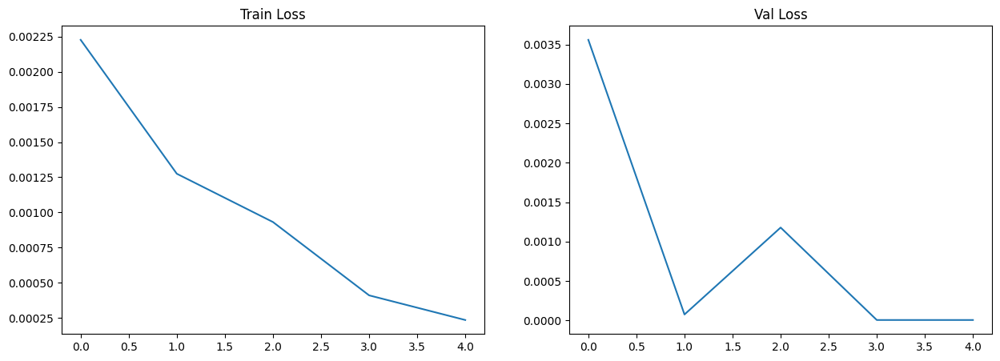

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(train_losses)
ax[0].set_title("Train Loss")
ax[1].plot(val_losses)
ax[1].set_title("Val Loss")
plt.show()

<ipython-input-22-ec2b4613abaf>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model.load_state_dict(torch.load('/content/drive/MyDrive/datasets/credit/best_model2.p

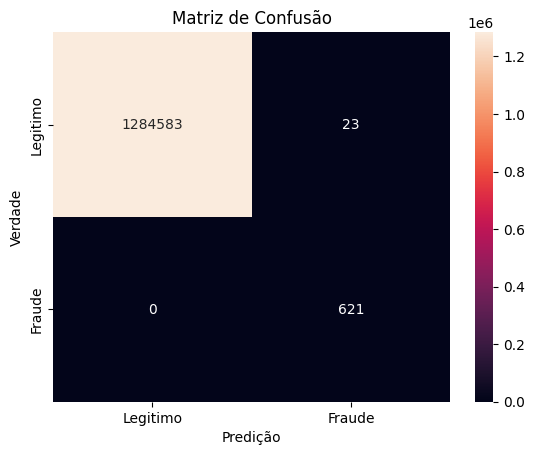

In [22]:
import torch
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

best_model = CreditCardMLP()
best_model.load_state_dict(torch.load('/content/drive/MyDrive/datasets/credit/best_model2.pth'))
best_model.to(device)
best_model.eval()

test_dataset = CreditCardDataset(test, scaler=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

y_pred = []
y_true = []
with torch.no_grad():
    for inputs, labels in test_dataloader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = best_model(inputs)
        predicted = (torch.sigmoid(outputs) > 0.5).cpu().numpy().astype(int).flatten().tolist()
        y_pred.extend(predicted)
        y_true.extend(labels.cpu().numpy().astype(int).flatten().tolist())

cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=['Legitimo', 'Fraude'], yticklabels=['Legitimo', 'Fraude'])
plt.xlabel('Predição')
plt.ylabel('Verdade')
plt.title('Matriz de Confusão')
plt.show()

#### Random forest

In [50]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix

class Model:
    def __init__(self, csv_paths, scaler=True):
        self.train, self.test = train_test_split(balanced_data, test_size=0.2, random_state=42)
        self.train, self.val = train_test_split(train, test_size=0.1, random_state=42)
        self.scaler = MinMaxScaler(feature_range=(0, 1))

    def load_data(self, csv_paths, fit_scaler=False):
        scaler = MinMaxScaler(feature_range=(0, 1))

        df = pd.read_csv(csv_paths[0])
        df = df.drop(df.columns[0], axis=1)
        m = df.to_numpy(dtype=np.float32)

        m0 = scaler.fit_transform(m.T[0::5]).T
        m1 = scaler.fit_transform(m.T[1::5]).T
        m2 = scaler.fit_transform(m.T[2::5]).T
        m3 = scaler.fit_transform(m.T[3::5]).T
        m4 = scaler.fit_transform(m.T[4::5]).T
        data = np.concatenate((m0, m1, m2, m3, m4), axis=1)


        for path in csv_pahts[1:]:
          df = pd.read_csv(path)
          df = df.drop(df.columns[0], axis=1)
          scaler = MinMaxScaler(feature_range=(0, 1))
          m = df.to_numpy(dtype=np.float32)

          if m.shape[0] == 0 or m.shape[1] == 0:
            continue

          m0 = scaler.fit_transform(m.T[0::5]).T
          m1 = scaler.fit_transform(m.T[1::5]).T
          m2 = scaler.fit_transform(m.T[2::5]).T
          m3 = scaler.fit_transform(m.T[3::5]).T
          m4 = scaler.fit_transform(m.T[4::5]).T
          df = np.concatenate((m0, m1, m2, m3, m4), axis=1)
          data = np.concatenate((data, df), axis=0)

        targets, labels = data[:, :-1], data[:, -1:]

        return targets, labels

    def fit(self, X_train, y_train, X_val, y_val, X_test, y_test):
        model = RandomForestClassifier(n_estimators=2, class_weight='balanced', max_depth=5, random_state=42)
        model.fit(X_train, y_train.ravel())

        y_val_pred = model.predict(X_val)
        print("Validation Results:")
        print(classification_report(y_val, y_val_pred))
        cm = confusion_matrix(y_val, y_val_pred)
        print(f"Confusion Matrix:\n{cm}")

        y_test_pred = model.predict(X_test)
        print("\nTest Results:")
        print(classification_report(y_test, y_test_pred))
        cm = confusion_matrix(y_test, y_test_pred)
        print(f"Confusion Matrix:\n{cm}")

        fig, ax = plt.subplots(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', ax=ax)
        ax.set_xlabel('Predição')
        ax.set_ylabel('Verdade')
        ax.set_title('Matriz de Confusão')
        plt.show()

        return model

model = Model(balanced_data)

In [32]:
X_train, y_train = model.load_data(model.train, fit_scaler=True)
X_val, y_val = model.load_data(model.val)
X_test, y_test = model.load_data(model.test)


Validation Results:
Accuracy: 1.0
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00   1284465
         1.0       1.00      1.00      1.00       617

    accuracy                           1.00   1285082
   macro avg       1.00      1.00      1.00   1285082
weighted avg       1.00      1.00      1.00   1285082

Confusion Matrix:
[[1284465       0]
 [      0     617]]

Test Results:
Accuracy: 1.0
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00   1284606
         1.0       1.00      1.00      1.00       621

    accuracy                           1.00   1285227
   macro avg       1.00      1.00      1.00   1285227
weighted avg       1.00      1.00      1.00   1285227

Confusion Matrix:
[[1284606       0]
 [      0     621]]


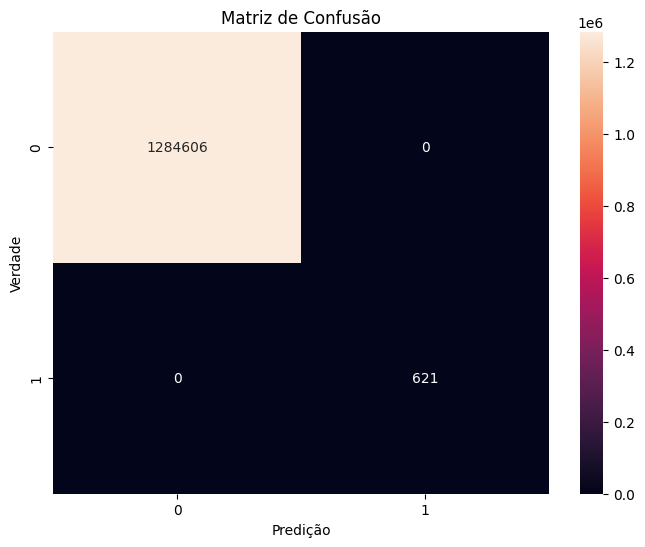

In [51]:
fitted_model = model.fit(X_train, y_train, X_val, y_val, X_test, y_test)

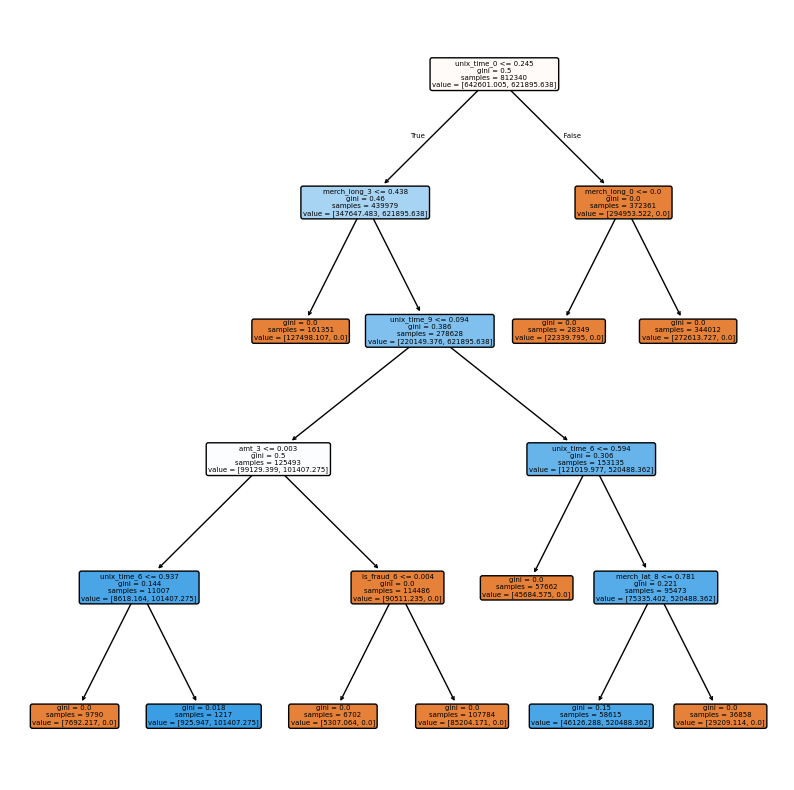

In [52]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

tree_index = 0

independent_variables = ['amt_0', 'merch_lat_0', 'merch_long_0', 'unix_time_0', 'is_fraud_0',
       'amt_1', 'merch_lat_1', 'merch_long_1', 'unix_time_1', 'is_fraud_1',
       'amt_2', 'merch_lat_2', 'merch_long_2', 'unix_time_2', 'is_fraud_2',
       'amt_3', 'merch_lat_3', 'merch_long_3', 'unix_time_3', 'is_fraud_3',
       'amt_4', 'merch_lat_4', 'merch_long_4', 'unix_time_4', 'is_fraud_4',
       'amt_5', 'merch_lat_5', 'merch_long_5', 'unix_time_5', 'is_fraud_5',
       'amt_6', 'merch_lat_6', 'merch_long_6', 'unix_time_6', 'is_fraud_6',
       'amt_7', 'merch_lat_7', 'merch_long_7', 'unix_time_7', 'is_fraud_7',
       'amt_8', 'merch_lat_8', 'merch_long_8', 'unix_time_8', 'is_fraud_8',
       'amt_9', 'merch_lat_9', 'merch_long_9', 'unix_time_9', 'is_fraud_9',
       'amt_10', 'merch_lat_10', 'merch_long_10', 'unix_time_10',
       'is_fraud_10', 'amt_11', 'merch_lat_11', 'merch_long_11',
       'unix_time_11', 'is_fraud_11', 'amt', 'merch_lat', 'merch_long',
       'unix_time']

plt.figure(figsize=(10,10))
plot_tree(fitted_model.estimators_[0], feature_names=independent_variables, filled=True, rounded=True, label="all")
plt.show()

In [53]:
import pickle

with open('/content/drive/MyDrive/datasets/credit/model5.pkl', 'wb') as f:
    pickle.dump(fitted_model, f)


In [54]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import pickle
from sklearn.tree import export_text, export_graphviz


for i in range(len(fitted_model.estimators_)):
  tree_rules = export_text(fitted_model.estimators_[i], feature_names=independent_variables)
  print("tree", i + 1)
  print(tree_rules)

tree 1
|--- unix_time_0 <= 0.25
|   |--- merch_long_3 <= 0.44
|   |   |--- class: 0.0
|   |--- merch_long_3 >  0.44
|   |   |--- unix_time_9 <= 0.09
|   |   |   |--- amt_3 <= 0.00
|   |   |   |   |--- unix_time_6 <= 0.94
|   |   |   |   |   |--- class: 0.0
|   |   |   |   |--- unix_time_6 >  0.94
|   |   |   |   |   |--- class: 1.0
|   |   |   |--- amt_3 >  0.00
|   |   |   |   |--- is_fraud_6 <= 0.00
|   |   |   |   |   |--- class: 0.0
|   |   |   |   |--- is_fraud_6 >  0.00
|   |   |   |   |   |--- class: 0.0
|   |   |--- unix_time_9 >  0.09
|   |   |   |--- unix_time_6 <= 0.59
|   |   |   |   |--- class: 0.0
|   |   |   |--- unix_time_6 >  0.59
|   |   |   |   |--- merch_lat_8 <= 0.78
|   |   |   |   |   |--- class: 1.0
|   |   |   |   |--- merch_lat_8 >  0.78
|   |   |   |   |   |--- class: 0.0
|--- unix_time_0 >  0.25
|   |--- merch_long_0 <= 0.00
|   |   |--- class: 0.0
|   |--- merch_long_0 >  0.00
|   |   |--- class: 0.0

tree 2
|--- is_fraud_7 <= 0.97
|   |--- merch_long_4 <= 